# Assessing climate change with satellite sea ice concentration products
Production date: 27-04-2025

Produced by: Nansen Environmental and Remote Sensing Center. Timothy Williams.

## 🌍 Use case: Suitability of satellite sea ice concentration products for assessment of the effect of climate change on sea ice

## ❓ Quality assessment question
**What are the limitations of using satellite sea ice concentration (SIC) products while assessing climate change?**

## 📢 Quality assessment statement
```{admonition} These are the key outcomes of this assessment
:class: note
- The SSMIS (Special Sensor Microwave Imager/Sounder) sea ice concentration (SIC) product covers the time period from October 1978 to September 2025 for both the Arctic and Antarctic, and is long enough to capture a clear trend of sea ice decline in the Arctic. The time series of sea ice extent derived from this product correlates very well with the one derived from AMSR (Advanced Microwave Scanning Radiometer) when it is available (June 2002 to December 2020), although the SSMIS extent is systematically higher than the AMSR one. One source of difference seem to come from land contamination issues in the SSMIS product, where ocean near land can have high SIC even though the AMSR product has none or little ice there. In addition the ice edge in the SSMIS product consistently extends further into the open ocean than in the AMSR product. This is most likely due to the larger satellite footprint of the SSMIS product (43x69km at the 19GHz
channel and 28x37km at the 37GHz channel) compared to AMSR (close to or better than the output grid resolution of 25km).

- While the SIC from AMSR is known to be affected by noise from atmospheric conditions, this did not seem to cause any issues in the examples looked at in this notebook.
However, it did have a long gap in coverage between 2011-10-04 and 2012-07-24 (294 days). 

- The SSMIS product also had one quite large gap in coverage, from 1986-03-28 to 1986-06-24 (88 days). It also had some spikes in the day-to-day extent (affecting both hemispheres), on 1984-09-14, 1984-11-19, and 2022-08-22, and one 2-day event (1989-07-21 and 1989-07-22) where extent dropped in the Antarctic for two days. However, given the overall length of the time series, and by considering monthly statistics, isolated events like these should have little effect. However, it would affect other uses for this product like data assimilation or model evaluation.
```

## 📋 Methodology
We use version 3 of the [<span style="color:blue">sea ice concentration dataset</span>](https://cds.climate.copernicus.eu/datasets/satellite-sea-ice-concentration?tab=overview), which has three products from EUMETSAT (European Organisation for the Exploitation of Meteorological Satellites) OSI SAF (Ocean and Sea Ice Satellite Applications Facility):
- SSMIS CDR (version 3.1, October 1978 to December 2020)
- SSMIS ICDR (version 3.0, January 2021 to September 2025)
- AMSR CDR (version 3.0, June 2002 to December 2020)

For each product, we initially create daily time series of the sea ice extent, defined as the area of grid cells with SIC > 15%, which is typically taken as the lowest SIC that passive microwave sensors can detect. Monthly statistics are then computed and plotted by year for selected months.

Maps comparing AMSR and SSMIS SIC fields are plotted to show sensor-related differences like resolution (AMSR has higher resolution), issues with land (SSMIS is more affected by this) and other systematic differences. Heat maps for one year are also plotted to show statistical differences.

The seasonal cycles are plotted for selected years to highlight some issues with the data, like gaps or suspicious spikes (temporary jumps or drops) in extent. The spatial changes in the SIC fields at the times of these spikes are illustrated.

The "Analysis and results" section is structured as follows:

**[](section-1)**

**[](section-2)**

**[](section-3)**

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;**[](section-3.1)**

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;**[](section-3.2)**

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;**[](section-3.3)**

**[](section-4)**

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;**[](section-4.1)**

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;**[](section-4.2)**

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;**[](section-4.3)**

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;**[](section-4.4)**

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;**[](section-4.5)**

## 📈 Analysis and results

(section-1)=
### 1. Parameters, requests and functions definition
- Define parameters and formulate requests for downloading with the EQC toolbox.
- Define functions to be applied to process and reduce the size of the downloaded data.
- Define functions to post-process and visualize the data.

#### 1.1 Import libraries
Import the required libraries, including the EQC toolbox.

In [1]:
import warnings
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
from matplotlib import colors as mcolors
import xarray as xr
from c3s_eqc_automatic_quality_control import diagnostics, download, plot
from cartopy import crs as ccrs
import numpy as np
import pandas as pd
import matplotlib as mpl
from cycler import cycler
from itertools import product
import calendar
import cmocean

plt.style.use("seaborn-v0_8-notebook")
warnings.filterwarnings("ignore", module="cf_xarray")
warnings.filterwarnings("ignore", module="earthkit")


def get_prop_cycle():
    linestyles = ['-', '--', '-.', ":"]
    # colorblind friendly color cycle
    # - see discussion at
    #   https://github.com/scverse/scanpy/issues/387
    colors = [
        'tab:blue',
        'tab:orange',
        'tab:red',
        'tab:gray',
        'tab:pink',
        ]
    return dict(zip(
        ["linestyle", "color"],
        list(zip(*product(linestyles, colors))),
        ))


mpl.rcParams['axes.prop_cycle'] = cycler(**get_prop_cycle())

#### 1.2 Set parameters
Set the time period to cover with `start_year` and `stop_year`.
Also specify `sic_threshold` - a grid cell is considered ice-covered if its concentration value (in %) exceeds this value. `extent_range` sets the plot range for the extent.

In [2]:
# Time
start_year = 1979
stop_year = 2025

# Conc threshold for calculating extent [%]
sic_threshold = 15

# range of sea ice extent for Arctic and Antarctic [10^6 km^2]
extent_range = {
    "northern_hemisphere": [3, 17.5],
    "southern_hemisphere": [1.5, 22],
}

#### 1.3 Define requests
Define the requests for downloading the sea ice concentration data using the EQC toolbox.

In [3]:
collection_id = 'satellite-sea-ice-concentration'

conc_request = {
    "origin": "eumetsat_osi_saf",
    "variable": "all",
    "temporal_aggregation": "daily", # need to download daily as monthly has no uncertainty; also AMSR has no monthly option
}
ssmis_request = conc_request | {"sensor": "ssmis"}
amsr_request = conc_request | {"sensor": "amsr", "version": "3_0", "cdr_type": "cdr"}

request_dict = {
    "SSMIS (CDR)": download.update_request_date(
       ssmis_request | {"cdr_type": "cdr", "version": "3_1"},
       start=f"{max(start_year, 1979)}-01",
       stop=f"{min(stop_year, 2020)}-12",
       stringify_dates=True,
    ),
    "SSMIS (ICDR)": download.update_request_date(
        ssmis_request | {"cdr_type": "icdr", "version": "3_0"},
        start=f"{max(start_year, 2021)}-01",
        stop=f"{min(stop_year, 2025)}-12",
        stringify_dates=True,
    ),
    "AMSR (CDR)": download.update_request_date(
        amsr_request,
        start=f"{max(start_year, 2002)}-01",
        stop=f"{min(stop_year, 2020)}-12",
        stringify_dates=True,
    ),
}

#### 1.4 Define function to cache
- `compute_siconc_time_series` computes the extent, area, and the RMS error from a given sea ice concentration product.

In [4]:
def compute_siconc_time_series(ds, sic_threshold):
    ds = ds.convert_calendar("standard", align_on="date")

    # grid cell area of sea ice edge grid
    dims = ("xc", "yc")
    dx = np.abs(np.diff(ds[dims[0]][:2].values))[0]
    grid_cell_area = (dx ** 2) * 1.0e-6  # 10^6 km2

    # get sea ice concentration and convert to ice/water classification
    sic = ds.cf["sea_ice_area_fraction"]
    sic_error = ds.cf["sea_ice_area_fraction standard_error"]
    if sic.attrs.get("units", "") == "(0 - 1)":
        sic *= 100
        sic_error *= 100

    # compute extent
    dataarrays = {}
    sic_class = xr.where(sic >= sic_threshold, 2, 1) # 1 = open water, 2 = ice
    dataarrays["extent"] = grid_cell_area * (sic_class - 1).sum(dim=dims)
    dataarrays["extent"].attrs = {
        "standard_name": "sea_ice_extent",
        "units": "$10^6$km$^2$",
        "long_name": "Sea ice extent",
    }

    # compute area
    dataarrays["area"] = grid_cell_area * .01 * sic.sum(dim=dims)
    dataarrays["area"].attrs = {
        "standard_name": "sea_ice_area",
        "units": "$10^6$km$^2$",
        "long_name": "Sea ice area",
    }

    # compute RMS error
    dataarrays["rms_error"] = np.sqrt((sic_error ** 2).mean(dim=dims))
    dataarrays["rms_error"].attrs = {
        "standard_name": "root_mean_square sea_ice_area_fraction standard_error",
        "units": "$10^6$km$^2$",
        "long_name": "Root mean square sea ice area fraction standard error",
    }

    return xr.Dataset(dataarrays)

#### 1.5 Custom download functions
- `download_sic_compare_one_day` downloads full SIC fields for a given date and region, in order to compare maps from the SSMIS and AMSR products.
- `download_sic_19840914`, `download_sic_19841119`, `download_sic_20220822` download full SIC fields (from SSMIS) for specific regions and date sequences to investigate suspicious spikes in daily extent.

In [5]:
def download_sic_compare_one_day(collection_id, comparison_date, hemisphere="north", **kwargs):
    common_request = {
        'origin': 'eumetsat_osi_saf',
        'variable': 'all',
        'temporal_aggregation': 'daily',
        'cdr_type': 'cdr',
        "year": [comparison_date.strftime("%Y")],
        "month": [comparison_date.strftime("%m")],
        "day": [comparison_date.strftime("%d")],
        "region": f"{hemisphere}ern_hemisphere",
    }
    requests = {
        "SSMIS": common_request | {'sensor': 'ssmis', 'version': '3_1'},
        "AMSR": common_request | {'sensor': 'amsr', 'version': '3_0'},
    }
    
    datasets = [download.download_and_transform(collection_id, req, **kwargs).expand_dims(product=[product])
        for product, req in requests.items()]
    return xr.concat(datasets, "product", join="outer")


def download_sic_19840914(collection_id, **kwargs):

    datasets = {}
    for hemisphere in ("north", "south"):
        request = {
            'origin': 'eumetsat_osi_saf',
            'variable': 'all',
            'temporal_aggregation': 'daily',
            'sensor': 'ssmis',
            'cdr_type': 'cdr',
            'version': '3_1',
            "year": ["1984"],
            "month": ["09"],
            "day": ["12", "14", "16"],
            "region": f"{hemisphere}ern_hemisphere",
        }
        datasets[hemisphere] = download.download_and_transform(
            collection_id, request, **kwargs)
    
    return datasets


def download_sic_19841119(collection_id, **kwargs):

    datasets = {}
    for hemisphere in ("north", "south"):
        request = {
            'origin': 'eumetsat_osi_saf',
            'variable': 'all',
            'temporal_aggregation': 'daily',
            'sensor': 'ssmis',
            'cdr_type': 'cdr',
            'version': '3_1',
            "year": ["1984"],
            "month": ["11"],
            "day": ["17", "19", "21"],
            "region": f"{hemisphere}ern_hemisphere",
        }
        datasets[hemisphere] = download.download_and_transform(
            collection_id, request, **kwargs)
    
    return datasets


def download_sic_19890721_19890722(collection_id, **kwargs):

    request = {
            'origin': 'eumetsat_osi_saf',
            'variable': 'all',
            'temporal_aggregation': 'daily',
            'sensor': 'ssmis',
            'cdr_type': 'cdr',
            'version': '3_1',
            "year": ["1989"],
            "month": ["07"],
            "day": ["20", "21", "22", "25"],
            "region": "southern_hemisphere",
        }
    return {"south": download.download_and_transform(
        collection_id, request, **kwargs)}


def download_sic_20220822(collection_id, **kwargs):

    datasets = {}
    for hemisphere in ("north", "south"):
        request = {
            'origin': 'eumetsat_osi_saf',
            'variable': 'all',
            'temporal_aggregation': 'daily',
            'sensor': 'ssmis',
            'cdr_type': 'icdr',
            'version': '3_0',
            "year": ["2022"],
            "month": ["08"],
            "day": ["21", "22", "23"],
            "region": f"{hemisphere}ern_hemisphere",
        }
        datasets[hemisphere] = download.download_and_transform(
            collection_id, request, **kwargs)
    
    return datasets

#### 1.5 Define functions to check datasets
- `quality_control` checks extent time series for gaps in time (longer than 1 day, as initially SSMIS data was only available every 2 days) and for large changes in extent.
- `check_datasets` loops over the datasets for a given hemisphere and runs `quality_control`

In [6]:
def quality_control(
    ds: xr.Dataset,
    time_dim: str = "time",
    extent_var: str = "extent",
    max_gap_days: float = 2.0,
    max_delta: float = 0.5,
):
    """
    Quality-control an xr.Dataset with a sea-ice (or similar) extent variable.

    Parameters
    ----------
    ds          : xr.Dataset containing at least `time_dim` and `extent_var`.
    time_dim    : Name of the time coordinate (default "time").
    extent_var  : Name of the extent variable in units of 10^6 km² (default "extent").
    max_gap_days: Flag consecutive time steps whose gap exceeds this many days (default 1.0).
    max_delta   : Flag steps where |Δextent| exceeds this value in 10^6 km² (default 0.5).

    Returns
    -------
    QCResult named-tuple with flagged timestamps, sizes, and a human-readable summary.
    """
    # ── 1. Extract & sort by time ──────────────────────────────────────────────
    times = pd.DatetimeIndex(ds[time_dim].values)
    order = times.argsort()
    times = times[order]

    extent = ds[extent_var].values
    if extent.ndim > 1:
        raise ValueError(f"Expected 1-D extent variable, got shape {extent.shape}.")
    extent = extent[order]

    # ── 2. Detect temporal gaps > max_gap_days ─────────────────────────────────
    dt_days = np.diff(times) / np.timedelta64(1, "D")   # float array of day-gaps
    gap_mask = dt_days > max_gap_days
    gap_times = times[:-1][gap_mask]        # timestamp *before* the gap
    gap_sizes = dt_days[gap_mask]

    # ── 3. Detect large extent jumps ───────────────────────────────────────────
    dt_days = np.diff(times) / np.timedelta64(1, "D")
    delta = np.diff(extent) / dt_days
    jump_mask = np.abs(delta) > max_delta  # now: max change per day
    jump_times = times[1:][jump_mask]       # timestamp where the jump is detected
    jump_sizes = delta[jump_mask]

    # ── 4. Build summary string ────────────────────────────────────────────────
    lines = [
        "Quality Control — extent (10⁶ km²)",
        f"  Period   : {times[0].date()} → {times[-1].date()}  ({len(times)} dates)",
        "",
    ]

    if len(gap_times):
        lines.append(f"  ⚠ Time gaps found  : {len(gap_times)}")
        for t0, g in zip(gap_times, gap_sizes):
            t1 = t0 + pd.Timedelta(days=g)
            lines.append(f"      {t0.date()} - {t1.date()}  →  {g:.2f} days")
    else:
        lines.append("  ✓ No time gaps exceeding threshold.")

    lines.append("")

    if len(jump_times):
        lines.append(f"  ⚠ Large jumps found : {len(jump_times)}")
        for t, j in zip(jump_times, jump_sizes):
            lines.append(f"      {t.date()}  Δextent = {j:.3f}")
    else:
        lines.append("  ✓ No extent jumps exceeding threshold.")

    summary = "\n".join(lines)
    print(summary)


def check_datasets(datasets_diagnostics, hemisphere="north"):
    """
    Print a summary of potential problems with the data
    
    Parameters
    ----------
    datasets_diagnostics : dict
        (name, xr.Dataset) pairs
        each dataset should contain a time-series of sea ice extent
    hemisphere : str
        either "north" or "south"
    """
    assert(hemisphere in ("north", "south"))
    region = f"{hemisphere}ern_hemisphere"
    region_str = f"{hemisphere.capitalize()}ern Hemisphere"
    for product, ds in datasets_diagnostics.items():
        print(f"\n{product}, {region_str}")
        print(50 * "-")
        quality_control(ds.sel(region=region).dropna(dim="time", subset=["extent"]))

#### 1.6 Define functions to plot monthly anomalies in extent
- `calc_climatology` calculates the reference climatology (mean extent) for a given month and reference period
- `calc_monthly_stats` calculates the monthly mean and standard deviation n extent for each year
- `plot_anomaly` plots errorbars

In [7]:
def calc_climatology(ds: xr.Dataset, month: int, clim_start: int, clim_stop: int) -> float:
    """Compute the climatological mean extent for 1980-2010."""
    sel = ds.sel(time=ds['time'].dt.month == month)
    clim = sel.sel(time=(sel['time'].dt.year >= clim_start) &
                        (sel['time'].dt.year <= clim_stop))
    return float(np.nanmean(clim['extent'].values))


def calc_monthly_stats(ds: xr.Dataset, month: int) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Return (years, mean_extent, std_extent) for a given calendar month."""
    sel = ds.sel(time=ds['time'].dt.month == month)
    years = np.unique(sel['time'].dt.year.values)
    means, stds = [], []
    for yr in years:
        vals = sel.sel(time=sel['time'].dt.year == yr)['extent'].values
        means.append(float(np.nanmean(vals)))
        stds.append(float(np.nanstd(vals)))
    return years, np.array(means), np.array(stds)

def plot_anomaly(dataset_diagnostics: dict, month: int, hemisphere: str="north", clim_source: str="SSMIS (CDR)", clim_start: int=1980, clim_stop: int=2010) -> plt.Figure:
    region = "northern_hemisphere" if hemisphere == "north" else "southern_hemisphere"
    region_label = "Arctic" if hemisphere == "north" else "Antarctic"
    ref_ds = dataset_diagnostics[clim_source].sel(region=region)
    clim_mean = calc_climatology(ref_ds, month, clim_start, clim_stop)
    fig, ax = plt.subplots(figsize=(10, 5))
    years_means = {}
    for name, ds in dataset_diagnostics.items():
        years, means, stds = calc_monthly_stats(ds.sel(region=region), month)
        
        # Fill missing years with NaN
        all_years = np.arange(years[0], years[-1] + 1)
        idx = all_years - years[0]
        full_means = np.full(len(all_years), np.nan)
        full_stds  = np.full(len(all_years), np.nan)
        present = np.isin(all_years, years)
        full_means[present] = means
        full_stds[present]  = stds
        
        anomalies = full_means - clim_mean
        marker = "s" if "AMSR" in name else "^"
        ax.errorbar(
            all_years, anomalies,
            yerr=full_stds,
            label=name,
            marker=marker,
            markersize=4,
            linewidth=1.2,
            elinewidth=0.7,
            capsize=3,
            capthick=0.7,
            alpha=0.85,
        )
        
        years_means[name] = (years, means)
        
    year0, val0 = [a[-1] for a in years_means["SSMIS (CDR)"]]
    year1, val1 = [a[0] for a in years_means["SSMIS (ICDR)"]]
    ax.plot([year0, year1], np.array([val0, val1]) - clim_mean, ":k")
    
    ax.axhline(0, color='0.4', linewidth=0.8, linestyle='--', zorder=0)
    ax.axvspan(clim_start, clim_stop, color='0.85', alpha=0.35, zorder=0,
               label=f'Climatology {clim_start}–{clim_stop}')
    month_name = calendar.month_name[month]
    ax.set_title(
        f'{region_label} {month_name} sea-ice extent anomaly\n'
        f'Relative to SSMIS climatology ({clim_start}–{clim_stop}): {clim_mean: .1f}$x10^6$km$^2$',
        fontsize=12,
    )
    ax.set_xlabel('Year')
    ax.set_ylabel('Extent anomaly (10⁶ km²)')
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(
        lambda x, _: f'{x:+.2f}'
    ))
    ax.xaxis.set_major_locator(mticker.MaxNLocator(integer=True))
    ax.legend(framealpha=0.9, fontsize=9)
    ax.grid(axis='y', linewidth=0.4, alpha=0.5)
    fig.tight_layout()

#### 1.7 Function to plot daily time series of extent

In [8]:
def plot_daily_time_series(datasets_diagnostics, year_interval=(2011,2013), hemisphere="north"):
    year_shift = 1987 # year when ssmis shifted to daily products
    num_old = np.sum([(year < year_shift) for year in year_interval])
    if num_old == 1:
        raise AssertionError(f"year range cannot cross {year_shift}")

    year0, year1 = year_interval
    num_years = year1 + 1 - year0
    
    fig, ax = plt.subplots(1,1, figsize=(5 * num_years,6))
    region = {"north": "northern_hemisphere", "south": "southern_hemisphere"}[hemisphere]

    for product, ds_full in datasets_diagnostics.items():
        years_full = ds_full.time.dt.year.values
        in_range = (years_full >= year0) * (years_full <= year1)
        if not np.any(in_range):
            continue
        ds = ds_full.sel(time=in_range, region=region)
            
        # insert points with nan's into big gaps
        times = pd.DatetimeIndex(ds.time.values)
        shifted = times + pd.Timedelta(days=4)
        to_add = [t for t in shifted if t not in times]
        ds = ds.reindex(time=pd.DatetimeIndex(sorted(list(times) + to_add)))

        # plot the filled line
        ax.plot(ds.time.values, ds.extent.values, label=product)

    ax.legend()
    region = "Arctic" if hemisphere == "north" else "Antarctic"
    ax.set_title(f"{region} extent {year0}-{year1}")
    ax.set_ylabel("Extent ($10^6$ km$^2$)")
    ax.tick_params(axis="x", rotation=45)
    for label in ax.get_xticklabels():
        label.set_ha("right")

#### 1.8 Functions to plot maps
- `plot_maps` is a generic function to plot an `xarray.DataArray` object.
- `compare_maps_one_day` plots maps of SIC from SSMIS and AMSR side-by-side.
- `diff_maps_one_day` plots a map of the difference in SIC (AMSR - SSMIS).
- `diff_masks_one_day` plots a map of the difference in SIC extent, with categories for both/neither having ice, and either AMSR/SSMIS having ice when the other doesn't have it.
- `compare_maps_anomaly` plots a date sequence of maps for a given region to visualise suspicious spikes in extent.
- `diff_maps_anomaly` plots the difference in SIC from SSMIS for a given date sequence and region to visualise suspicious spikes in extent.

In [9]:
def plot_maps(da_in, hemisphere="north", xy_slice=None, title_template="{value}", cbar_extend="neither", **kwargs):
    # projection
    proj = ccrs.Stereographic(central_latitude=90 if hemisphere == "north" else -90)

    # zoom in on variable to plot
    if xy_slice is None:
        xy_slice = slice(90,310) if hemisphere == "north" else slice(45,355)
    da = da_in.isel(xc=xy_slice, yc=xy_slice)

    plot_output = plot.projected_map(da, cbar_kwargs={"pad" : .025, 'shrink': .45, 'extend': cbar_extend}, projection=proj,
                                     robust=True, show_stats=False, **kwargs)
    if hasattr(plot_output, "set_titles"):
        plot_output.set_titles(template=title_template)
        return plot_output.axs[0]
    else:
        plot_output.axes.set_title(title_template)
        return plot_output.axes


def compare_maps_one_day(ds, hemisphere="north", fig_size=(14,8), **kwargs):
    comparison_date = pd.Timestamp(ds.time.values[0])
    da = ds["ice_conc"]
    da.attrs["long_name"] = "SIC"
    sic_class = xr.where(da >= 15, 2, 1) # 1 = open water, 2 = ice
    extent = (25 ** 2) * 1e-6 * (sic_class - 1).sum(dim=("xc", "yc")).values.flatten()

    region_label = "Arctic" if hemisphere == "north" else "Antarctic"
    title_template = region_label + " ({value}): " + comparison_date.strftime("%Y-%m-%d")
    axs = plot_maps(da, title_template=title_template, col="product", hemisphere=hemisphere,
                    cmap=cmocean.cm.ice, figsize=fig_size, **kwargs)

    # add the extent to the title
    for i,ax in enumerate(axs[:2]):
        ttl = ax.get_title()
        ax.set_title(ttl + f"\nExtent={extent[i]:0.2f}" + r" $\times10^6$ km$^2$")


def diff_maps_one_day(ds, hemisphere="north", fig_size=(8.75,8), **kwargs):
    comparison_date = pd.Timestamp(ds.time.values[0])
    diff = ds["ice_conc"].sel(product="AMSR") - ds["ice_conc"].sel(product="SSMIS")
    diff.attrs["long_name"] = r"$\Delta$SIC"
    region_label = "Arctic" if hemisphere == "north" else "Antarctic"
    title_template = region_label + r" $\Delta$SIC" + " (AMSR - SSMIS): " + comparison_date.strftime("%Y-%m-%d")
    plot_maps(diff, title_template=title_template, hemisphere=hemisphere, cmap=cmocean.cm.balance,
              cbar_extend="both", vmin=-20, vmax=20, figsize=fig_size, **kwargs)


def diff_masks_one_day(ds, hemisphere="north", fig_size=(8.75, 8), **kwargs):
    comparison_date = pd.Timestamp(ds.time.values[0])
    sic1 = ds["ice_conc"].sel(product="AMSR").isel(time=0)
    sic0 = ds["ice_conc"].sel(product="SSMIS").isel(time=0)

    mask1 = (sic1 > 15).astype(int)  # AMSR ice
    mask0 = (sic0 > 15).astype(int)  # SSMIS ice
    land = np.isnan(sic0.values) | np.isnan(sic1.values)

    # Encode 4 categories: 0=None, 1=AMSR only, 2=SSMIS only, 3=Both (-1=land)
    category = xr.where(land, -1,  2 * mask0 + mask1)
    category.attrs["long_name"] = "Ice extent category"

    # Categorical colormap: white (land), blue, yellow, red, purple
    colors = ["#ffffff", "#92c5de", "#ffffbf", "#d6604d", "#762a83"]
    cmap = mcolors.ListedColormap(colors)
    bounds = [-1.5, -0.5, 0.5, 1.5, 2.5, 3.5]
    norm = mcolors.BoundaryNorm(bounds, cmap.N)

    region_label = "Arctic" if hemisphere == "north" else "Antarctic"
    title_template = (
        region_label + " ice extent (AMSR vs SSMIS): " + comparison_date.strftime("%Y-%m-%d")
    )

    ax = plot_maps(
        category,
        title_template=title_template,
        hemisphere=hemisphere,
        cmap=cmap,
        norm=norm,
        vmin=bounds[0],
        vmax=bounds[-1],
        cbar_extend="neither",
        figsize=fig_size,
        **kwargs,
    )
    cbar_ax = ax.figure.axes[-1]
    cbar_ax.set_yticks([0,1,2,3])
    cbar_ax.set_yticklabels(["None", "AMSR", "SSMIS", "Both"])
    cbar_ax.set_ylim([bounds[1], bounds[-1]])


def compare_maps_anomaly(datasets, hemisphere="north"):
    da = datasets[hemisphere]["ice_conc"]
    da.attrs["long_name"] = "SIC"
    da = da.assign_coords({"time": pd.DatetimeIndex(da.time.values).strftime("%Y-%m-%d")})
    region_label = "Arctic" if hemisphere == "north" else "Antarctic"
    title_template = region_label + " (SSMIS): {value}"
    plot_maps(da, title_template=title_template, col="time", hemisphere=hemisphere, cmap=cmocean.cm.ice, figsize=(21,8))


def diff_maps_anomaly(datasets, hemisphere="north"):
    da = datasets[hemisphere]["ice_conc"]
    sic1 = da.isel(time=slice(1, None))
    sic0 = da.isel(time=slice(None, -1))
    sic0, sic1 = [da.assign_coords({"time": pd.DatetimeIndex(sic1.time.values).strftime("%Y-%m-%d")}) for da in (sic0, sic1)]
    diff = sic1 - sic0
    diff.attrs["long_name"] = r"$\Delta$SIC"
    region_label = "Arctic" if hemisphere == "north" else "Antarctic"
    title_template = region_label + " (SSMIS): {value}"
    plot_maps(diff, title_template=title_template, col="time", hemisphere=hemisphere, cmap=cmocean.cm.balance, vmin=-20, vmax=20, cbar_extend="both", figsize=(14,8))

#### 1.9 Functions to make scatterplots of AMSR against SSMIS
- `scatter_amsr_vs_ssmis` creates the scatter plot
- `plot_conc_scatter` downloads one year of data for each hemisphere and calls `scatter_amsr_vs_ssmis`. The download is done inside this function so the data doesn't need to be kept in memory.

In [10]:
def scatter_amsr_vs_ssmis(ds_amsr, ds_ssmis, ax=None, varname="ice_conc", title="Sea Ice Concentration: AMSR vs SSMIS",
                        bins=300, cmap="plasma", figsize=(7, 6)):
    """
    Scatterplot of AMSR vs SSMIS sea ice concentration.

    Parameters
    ----------
    amsr, ssmis : xr.Dataset
    varname     : str   Variable name to extract if inputs are Datasets.
    """
    # --- Extract DataArrays ---
    amsr = ds_amsr[varname]
    ssmis = ds_ssmis[varname]

    # --- Align on common times if xarray (handles missing days automatically) ---
    amsr, ssmis = xr.align(amsr, ssmis, join="inner")  # keeps common times only
    a_flat = amsr.values.ravel()
    s_flat = ssmis.values.ravel()

    # --- Joint NaN mask (handles differing spatial masks) ---
    valid  = np.isfinite(a_flat) & np.isfinite(s_flat)
    n = valid.sum()
    a_v, s_v = a_flat[valid], s_flat[valid]

    # --- Plot ---
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)

    if n > 5_000:
        hb = ax.hexbin(s_v, a_v, gridsize=bins, cmap=cmap, mincnt=1, bins="log")
        cb = ax.figure.colorbar(hb, ax=ax, pad=0.02)
        cb.set_label("log₁₀(count)", fontsize=10)
    else:
        ax.scatter(s_v, a_v, s=6, alpha=0.4, color="steelblue", edgecolors="none")

    lims = [min(ax.get_xlim()[0], ax.get_ylim()[0]),
            max(ax.get_xlim()[1], ax.get_ylim()[1])]
    ax.plot(lims, lims, "w--" if n > 5_000 else "k--", lw=1, alpha=0.7, label="1:1 line")

    bias = np.mean(a_v - s_v)
    rmsd = np.sqrt(np.mean((a_v - s_v) ** 2))
    corr = np.corrcoef(s_v, a_v)[0, 1]
    stats = f"N = {n:,}\nBias = {bias:+.4f}\nRMSD = {rmsd:.4f}\nr = {corr:.4f}"
    ax.text(0.03, 0.97, stats, transform=ax.transAxes,
            va="top", ha="left", fontsize=9,
            bbox=dict(boxstyle="round,pad=0.4", fc="white", alpha=0.7))

    ax.set_xlabel("SSMIS SIC [%]", fontsize=11)
    ax.set_xlim([0,100])
    ax.set_ylim([0,100])
    ax.set_ylabel("AMSR SIC [%]",  fontsize=11)
    ax.set_title(title, fontsize=12)
    ax.legend(fontsize=9)
    ax.set_aspect("equal")
    plt.tight_layout()


def plot_conc_scatter(request_dict, year, **kwargs):
    """
    Download 1 year of data for both the Arctic and the Antarctic and make a heat map or scatter plot.
    Do the download inside this function to clear the memory after plotting.
    
    Parameters
    ----------
    request_dict : dict
    year : list(int)
    kwargs for download.download_and_transform
    """
    fig, axs = plt.subplots(1, 2, figsize=(14,6), sharey=True)
    common_request = {
        'origin': 'eumetsat_osi_saf',
        'variable': 'all',
        'temporal_aggregation': 'daily',
        'cdr_type': 'cdr',
        "year": [str(year)],
        "month": [f"{i:02d}" for i in range(1,13)],
        "day": [f"{i:02d}" for i in range(1,32)],
    }
    requests = {
        "SSMIS": {'sensor': 'ssmis', 'version': '3_1'},
        "AMSR": {'sensor': 'amsr', 'version': '3_0'},
    }

    for hemisphere, ax in zip(("north", "south"), axs):
        region = f"{hemisphere}ern_hemisphere"
        region_str = "Arctic" if hemisphere == "north" else "Antarctic"

        # download both products
        datasets = {}
        for name, request in requests.items():
            datasets[name] = download.download_and_transform(
                collection_id,
                common_request | request | {"region": region},
                **kwargs)

        # make the scatter plot
        scatter_amsr_vs_ssmis(datasets["AMSR"], datasets["SSMIS"], ax=ax,
                           title=f"Sea Ice Concentration ({region_str}, {year})",)
        del(datasets)
    axs[-1].set_ylabel("")

(section-2)=
### 2. Download and transform data

#### 2.1 Main download: all available daily extents for 1979-2025
This is where the main download is done. The daily SIC fields are transformed with `compute_siconc_time_series`, and then saved to disk by the EQC toolbox. If the code is rerun the transformed data is loaded from the disk.

In [ ]:
download_kwargs = {
    "drop_variables": (
        "raw_ice_conc_values",
        "smearing_standard_error",
        "algorithm_standard_error",
        "status_flag",
    ),
}

datasets_diagnostics = {}
datasets = []
for product, requests in request_dict.items():
    for region in [
        "northern_hemisphere",
        "southern_hemisphere",
    ]:
        print(f"{product = }, {region = }")
        regional_requests = [request | {"region": region} for request in requests]
        ds = download.download_and_transform(
            collection_id, regional_requests,
            transform_func=compute_siconc_time_series,
            transform_func_kwargs={"sic_threshold": sic_threshold},
            chunks={"year": 1},
            **download_kwargs,
        )
        datasets.append(ds.expand_dims(region=[region]).compute())
    datasets_diagnostics[product] = xr.concat(datasets, "region", join="outer", coords="different", compat="equals")
    datasets = []

#### 2.2 Download SIC for SSMIS - AMSR comparisons
Here we download full SIC fields for specific dates and regions, in order to compare maps from the SSMIS and AMSR products.

In [ ]:
ds_arctic_20120915 = download_sic_compare_one_day(collection_id, pd.Timestamp("2012-09-15"), hemisphere="north", **download_kwargs)
ds_arctic_20130315 = download_sic_compare_one_day(collection_id, pd.Timestamp("2013-03-15"), hemisphere="north", **download_kwargs)
ds_antarctic_20120915 = download_sic_compare_one_day(collection_id, pd.Timestamp("2012-09-15"), hemisphere="south", **download_kwargs)
ds_antarctic_20130215 = download_sic_compare_one_day(collection_id, pd.Timestamp("2013-02-15"), hemisphere="south", **download_kwargs)

#### 2.3 Download SIC for anomalies
Here we download full SIC fields (from SSMIS) for specific regions and date sequences in order to investigate suspicious spikes in daily extent.

In [ ]:
datasets_19840914 = download_sic_19840914(collection_id, **download_kwargs)
datasets_19841119 = download_sic_19841119(collection_id, **download_kwargs)
datasets_20220721_20220722 = download_sic_19890721_19890722(collection_id, **download_kwargs)
datasets_20220822 = download_sic_20220822(collection_id, **download_kwargs)

(section-3)=
### 3. General comparison of the products

(section-3.1)=
#### 3.1. Sea ice minima
Below we can see monthly anomalies in extent relative to climatologies computed from 1980-2010, for the months when the minimum extent occurs. In the Arctic September, the long temporal coverage of the SSMIS product enables a clear overall decline in sea ice extent to be seen. There is a large drop in extent in 2007, and large increases in 2013 and 2021. The first two of these events also occur in the AMSR time series, and in general the AMSR anomalies are well correlated with the SSMIS ones over the period when it is available. The last event, which occurs at the end of the two CDRs, is checked by ensuring that the daily extents derived from SSMIS are continuous as we go from 2020 to 2021. This is shown in section 4.

The AMSR anomalies are systematically less than the SSMIS ones. The sources for this discrepancy are discussed further in section 3.3.

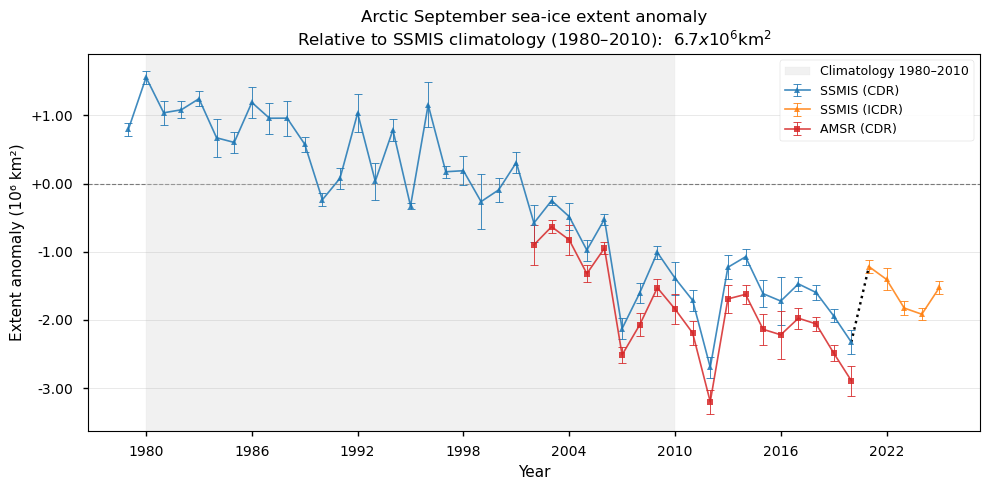

In [14]:
_ = plot_anomaly(datasets_diagnostics, 9, hemisphere="north")

In contrast, for the Antarctic, there is not a clear drop in sea ice extent compared to the climatology. However, the extents after about 2016 have all been beneath the climatology. As for the Arctic, the AMSR extents are systematically less than the SSMIS ones. There is also a missing year (2012) visible in the AMSR time series. Gaps in the data and other quality control issues are discussed further below.

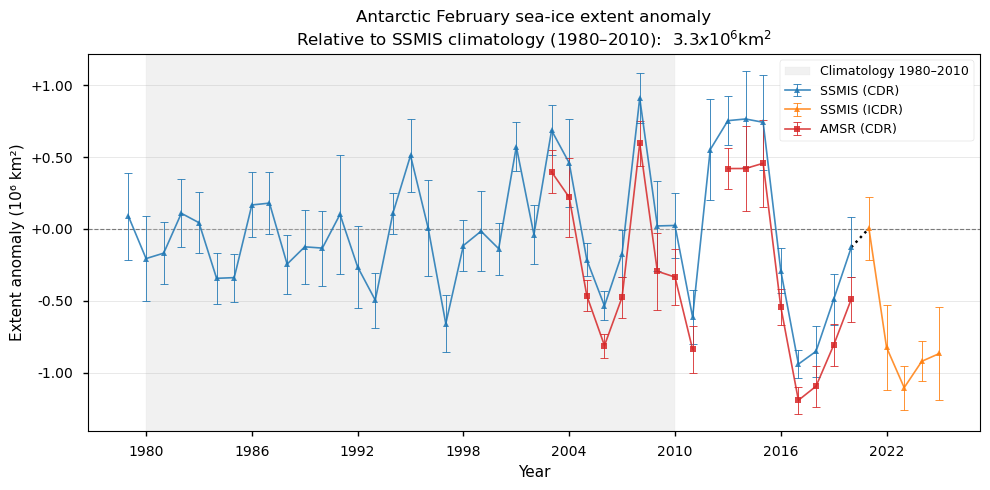

In [15]:
_ = plot_anomaly(datasets_diagnostics, 2, hemisphere="south")

(section-3.2)=
#### 3.2. Sea ice maxima
Below we can see monthly anomalies in extent relative to climatologies computed from 1980-2010, for the months when the maximum extent occurs. As with the Arctic minimum, the SSMIS product again shows a clear overall decline in sea ice extent. The AMSR anomalies are again well correlated with the SSMIS ones, but there is a greater difference from the SSMIS product compared to the time of the minimum. This is discussed further below.

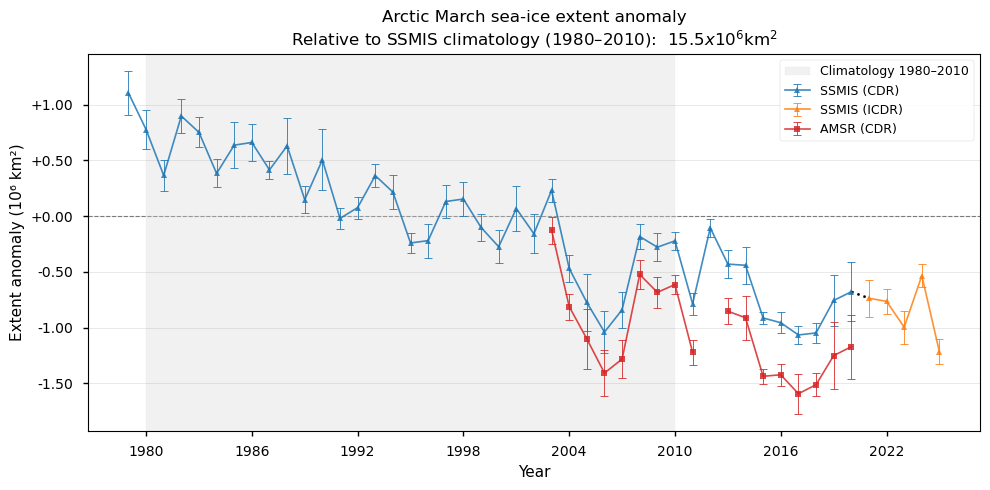

In [16]:
_ = plot_anomaly(datasets_diagnostics, 3, hemisphere="north")

The Antarctic anomalies for September are plotted below. They follow a similar pattern to the Antarctic February.

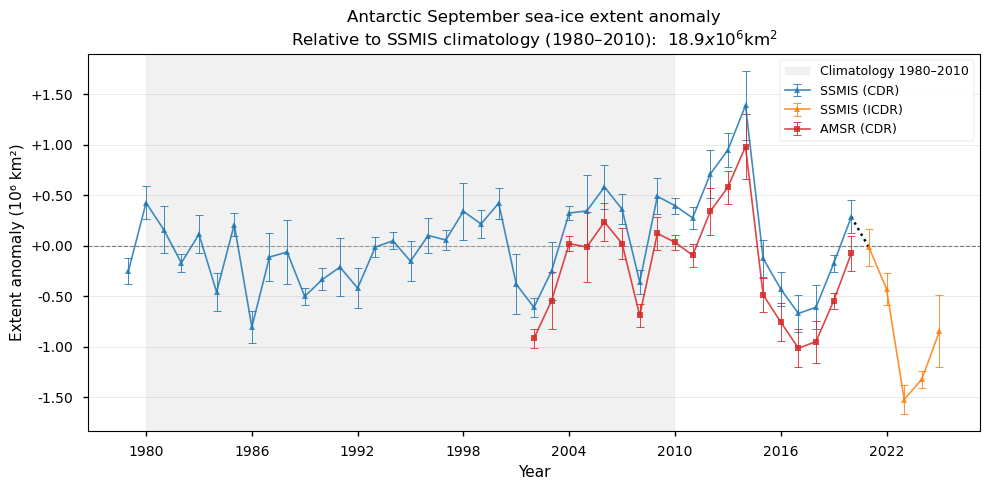

In [17]:
_ = plot_anomaly(datasets_diagnostics, 9, hemisphere="south")

(section-3.3)=
#### 3.3. Spatial comparison

##### 3.3.1 Arctic

In-depth discussions on uncertainties in SIC derived from passive microwave are given by [<span style="color:blue">Ivanova et al (2015)</span>](https://doi.org/10.5194/tc-9-1797-2015), [<span style="color:blue">Comiso et al (1997)</span>](https://doi.org/10.1016/S0034-4257%2896%2900220-9) and [<span style="color:blue">Buckley et al (2024)</span>](https://doi.org/10.5194/egusphere-2024-3861).

Below we show maps of SIC comparing SSMIS to AMSR on 2012-09-15, a date near the Arctic minimum. The two SIC fields are similar, although much more details are present in the higher-resolution AMSR product. However, in the Canadian Archipelago for example, there is a lot more ice present in the SSMIS product than the AMSR one, which would contribute to the larger extent. Given the known issues of land contamination in the SSMIS product, the AMSR extent is probably more reliable. Although AMSR is known to be affected by noise due to atmospheric conditions, this does not seem to be causing issues in this example. It may only be a factor on output grids with higher resolution.

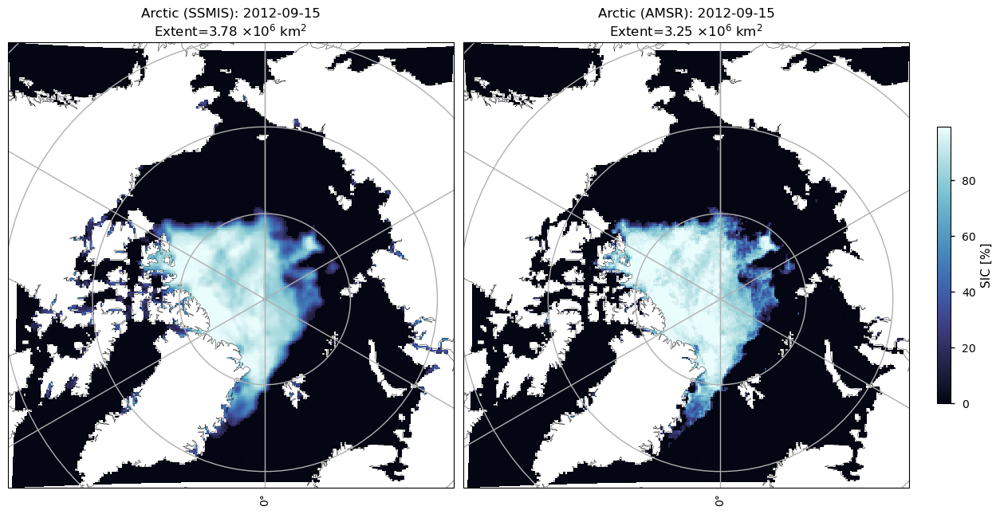

In [18]:
compare_maps_one_day(ds_arctic_20120915, hemisphere="north")

The difference between the two SIC fields also highlights the land issues. While the SIC in AMSR is higher than in SSMIS in the central Arctic, the ice edge in SSMIS consistently extends further than in AMSR, possibly due to blurring from its larger footprint.

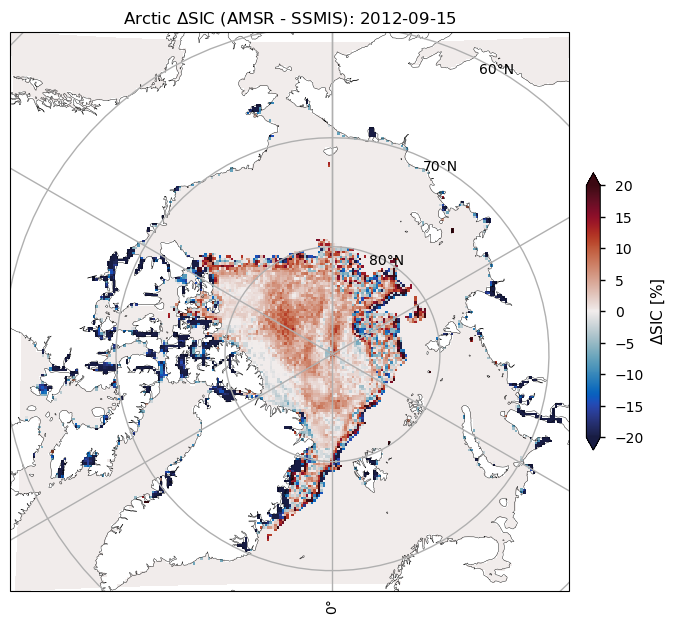

In [19]:
diff_maps_one_day(ds_arctic_20120915, hemisphere="north")

Below maps of SIC are shown comparing SSMIS to AMSR on 2013-03-15, a date near the Arctic maximum. Again the resolution difference is apparent.

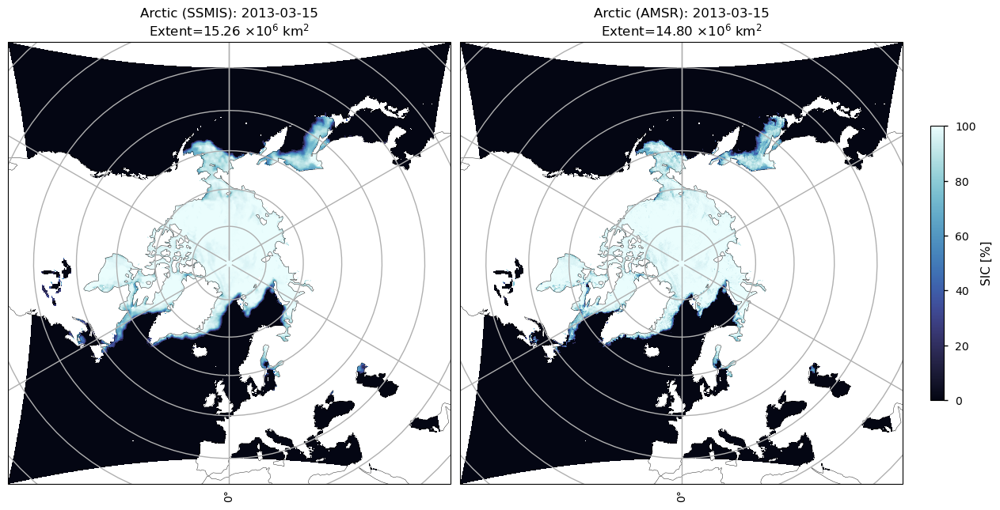

In [20]:
compare_maps_one_day(ds_arctic_20130315, hemisphere="north", xy_slice=slice(None))

Again, the ice edge from SSMIS consistently extends further than with AMSR, despite the AMSR SIC often being higher further away from the edge. And agin, land effects in relatively southern latitudes (less than 50$^\circ$N) are playing a significant role in the difference in extent.

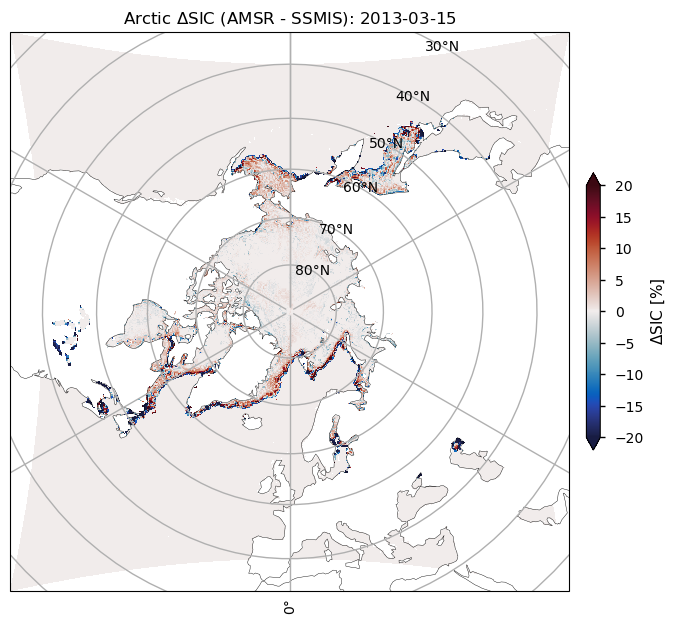

In [21]:
diff_maps_one_day(ds_arctic_20130315, hemisphere="north", xy_slice=slice(None))

##### 3.3.2 Antarctic

Below maps of SIC are shown comparing SSMIS to AMSR on 2013-02-15, a date near the Antarctic minimum. Again much more details are present in the higher-resolution AMSR product.

Unlike in the Arctic, here there is not an obvious explanation for the difference in extents between the two products. As well as the contribution ofland effects, it is possibly due to blurring of the ice edge in the SSMIS product increasing its extent in general.

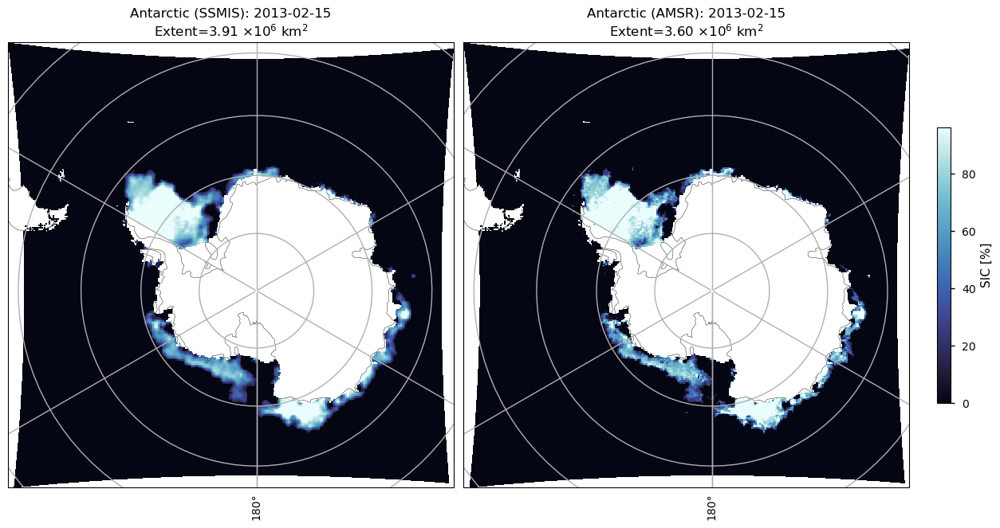

In [22]:
compare_maps_one_day(ds_antarctic_20130215, hemisphere="south")

Looking at the difference between the two fields, the main difference in extent is occurring at near land or ice sheets, and not as much at the outer ice edge. However, the SIC from AMSR is often higher than in SSMIS away from the ice edge.

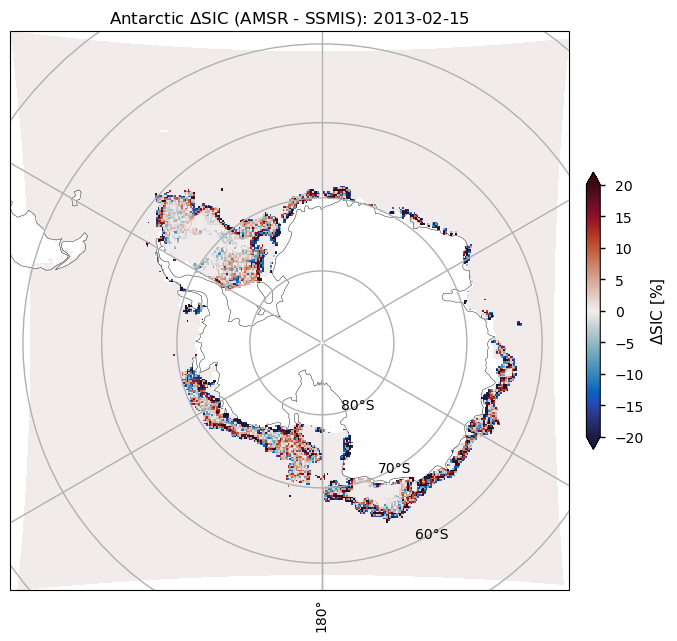

In [23]:
diff_maps_one_day(ds_antarctic_20130215, hemisphere="south")

Below maps of SIC are shown comparing SSMIS to AMSR on 2012-09-15, a date near the Antarctic maximum. For this date, the difference in extent is entirely coming from the outer ice edge. This is possibly due to blurring of the ice edge in the lower-resolution SSMIS product increasing its extent in general.

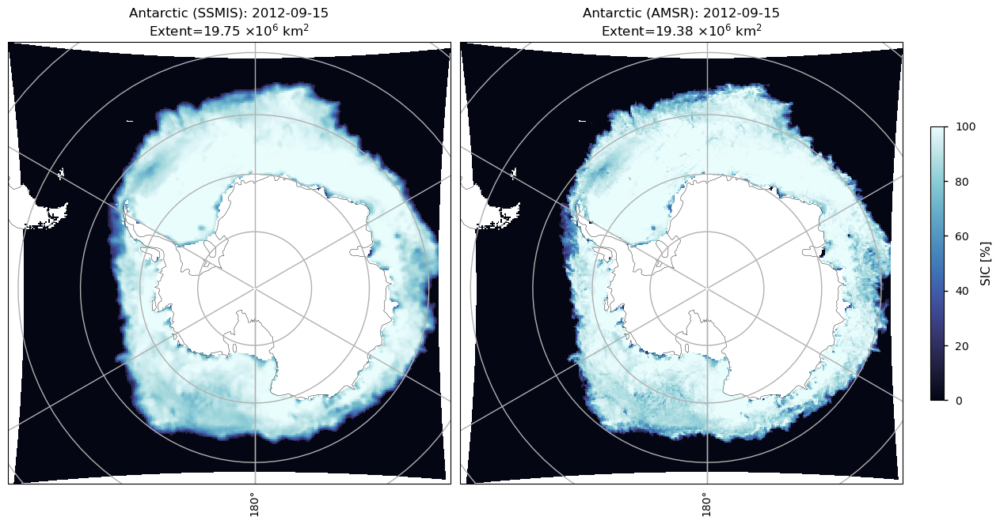

In [24]:
compare_maps_one_day(ds_antarctic_20120915, hemisphere="south")

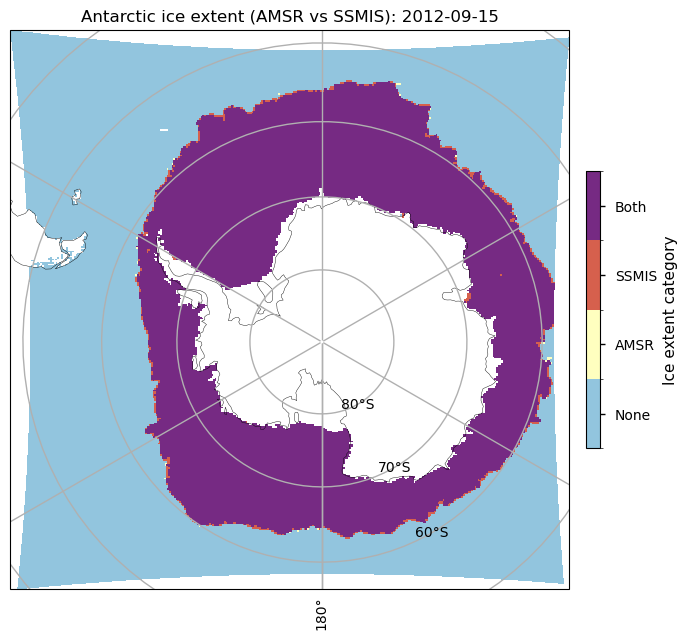

In [25]:
diff_masks_one_day(ds_antarctic_20120915, hemisphere="south")

##### 3.3.3 Statistical comparison
Below we plot heat maps of the AMSR SIC for 2013 against the SSMIS SIC for both hemispheres. It can be seen that for high concentrations in the Antarctic (top right corner) AMSR SIC being higher than SSMIS SIC is more common than in the Arctic. For low AMSR concentrations, moderate SSMIS concentrations are more common in the Arctic than in the Antarctic, indicating more similar extents in the Antarctic.
The heat maps also show some signs of filtering in the AMSR SIC (it is more affected by noise from atmospheric conditions), with 30% and 70% being quite common values.

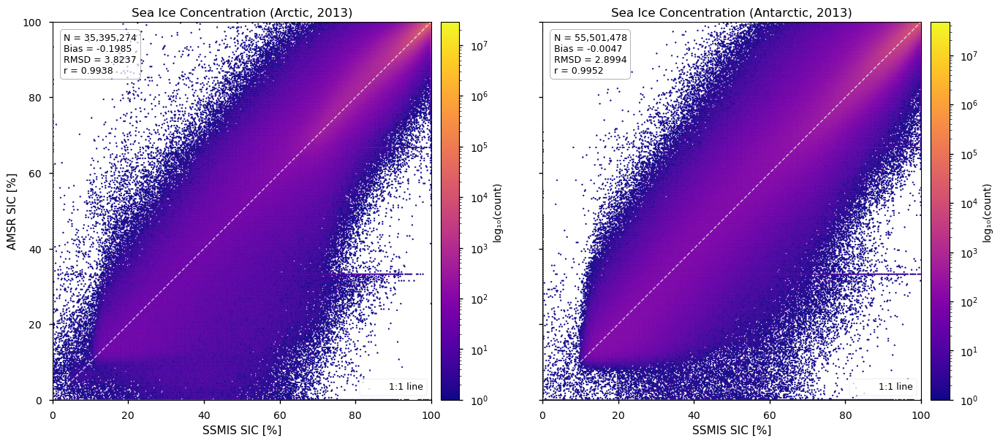

In [26]:
plot_conc_scatter(request_dict, 2013, **download_kwargs)

(section-4)=
### 4. Quality control

An automatic quality check can be run with e.g. `check_datasets(datasets_diagnostics, hemisphere="north")` to detect gaps and suspicious jumps in extent in each product. The print-outs are not shown, but some more marked anomalies are presented here.

(section-4.1)=
#### 4.1 Overview

Before 1987, SIC (from the SSMIS CDR) was only available every two days, and there were also larger gaps, like the one seen below from 1986-03-28 to 1986-06-24, which lasted 88 days. There are also spikes (sudden increases followed by similar decreases) visible on 1984-09-14 and 1984-11-19. These gaps and spikes were present in both hemispheres.

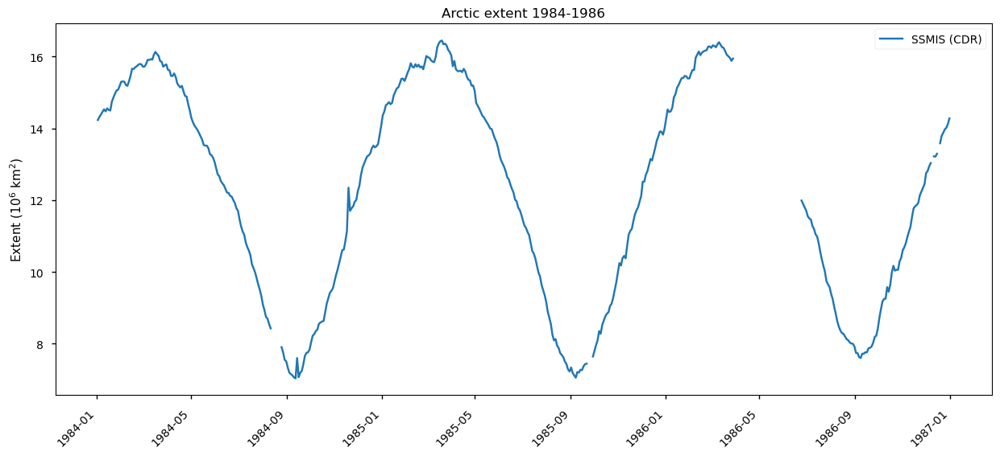

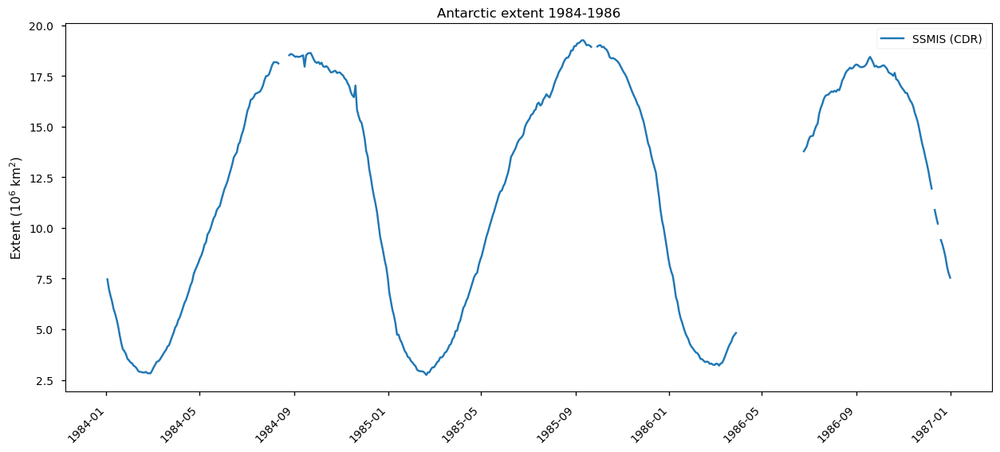

In [27]:
for hemisphere in ("north", "south"):
    plot_daily_time_series(datasets_diagnostics, year_interval=(1984,1986), hemisphere=hemisphere)
    plt.show()

In the Antarctic, there is also a 2-day drop (before a 2-day gap) fromn 1989-07-21 to 1989-07-22.

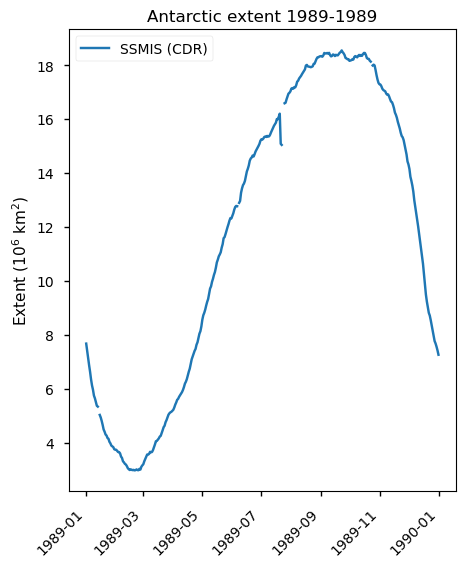

In [28]:
plot_daily_time_series(datasets_diagnostics, year_interval=(1989,1989), hemisphere="south")

It can be seen below that the AMSR CDR also had quite a large gap (in both hemispheres) from 2011-10-04 to 2012-07-24 (294 days). It can also be seen that its extent is consistently lower than the extent from the SSMIS CDR.

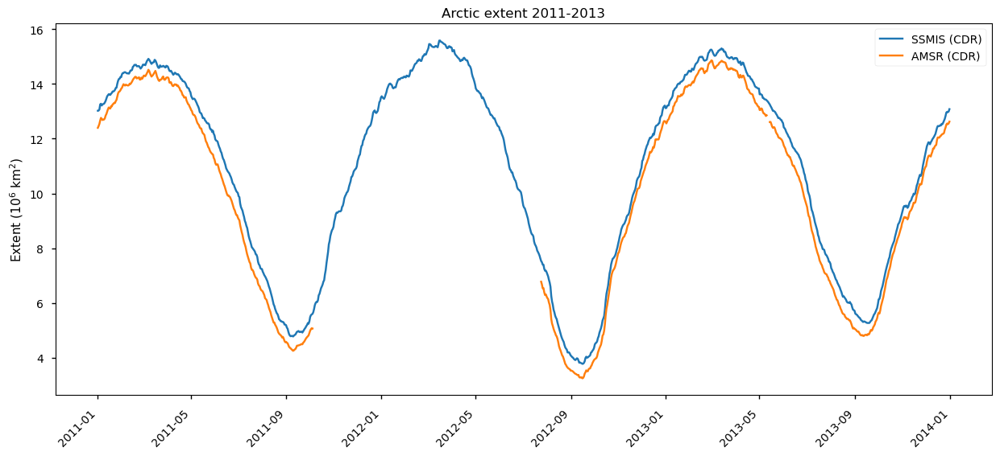

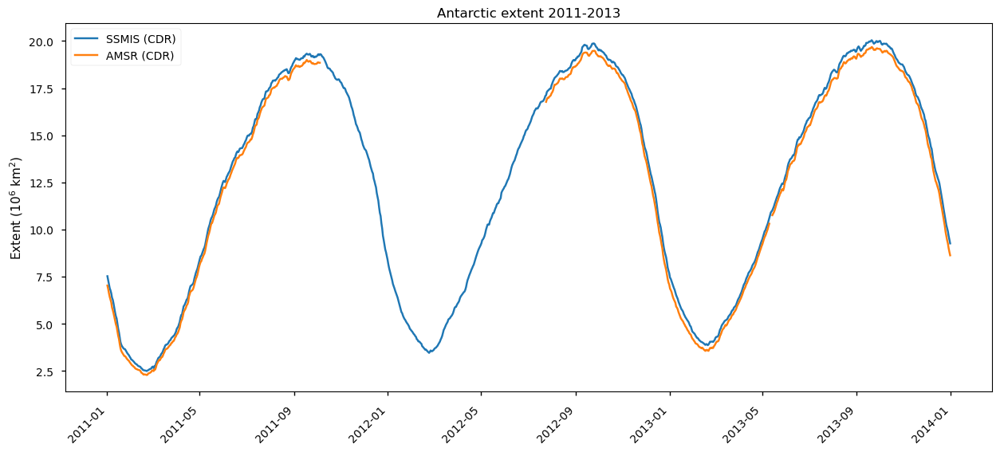

In [29]:
for hemisphere in ("north", "south"):
    plot_daily_time_series(datasets_diagnostics, year_interval=(2011,2013), hemisphere=hemisphere)
    plt.show()

Below we plot the extent from all three products for 2019-2022. We can see that the extent from SSMIS is continuous as it transitions from 2020 to 2021.
However, in both hemispheres, it has a sharp drop on 2022-8-22 which is reversed the following day.

The AMSR CDR product also ends in 2020. As during 2011-2013, the extent from this product is consistently lower than from SSMIS.

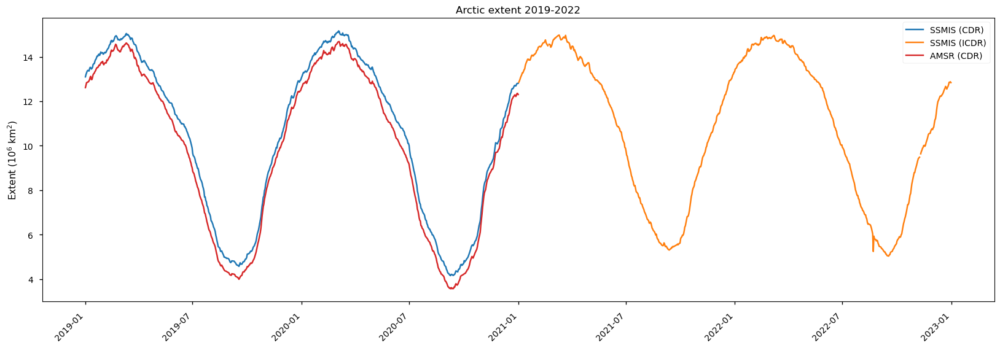

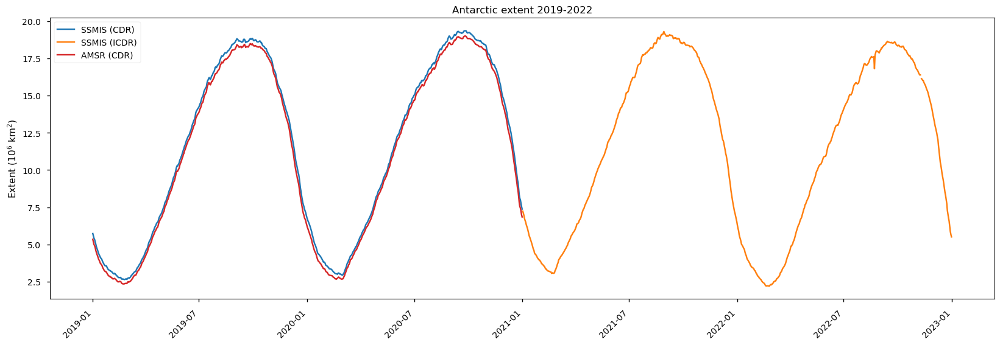

In [30]:
for hemisphere in ("north", "south"):
    plot_daily_time_series(datasets_diagnostics, year_interval=(2019,2022), hemisphere=hemisphere)
    plt.show()

(section-4.2)=
#### 4.2 Anomaly on 1984-09-14
Below we can see maps for both hemispheres for the days surrounding the anomaly. In the Arctic there is a sudden temporary increase in the SIC in the Greenland Sea and the Canadian Archipelago, while in the Antarctic there is a sudden temporary jump around longitude 180$^\circ$E. The Arctic also shows temporary drops in the Beaufort Sea and also around the north pole.

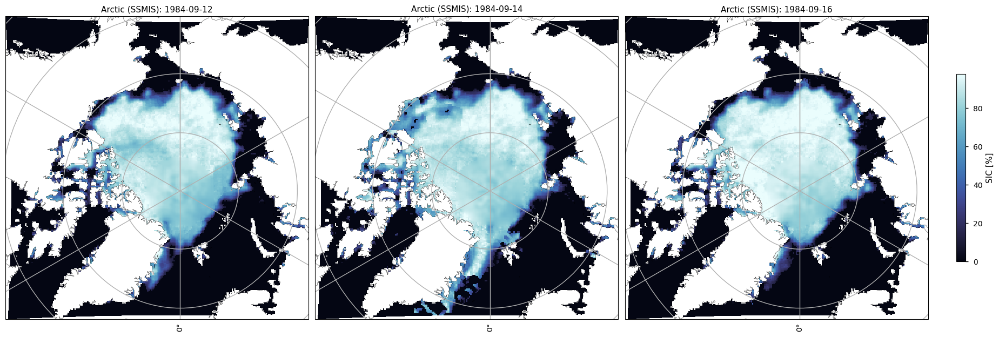

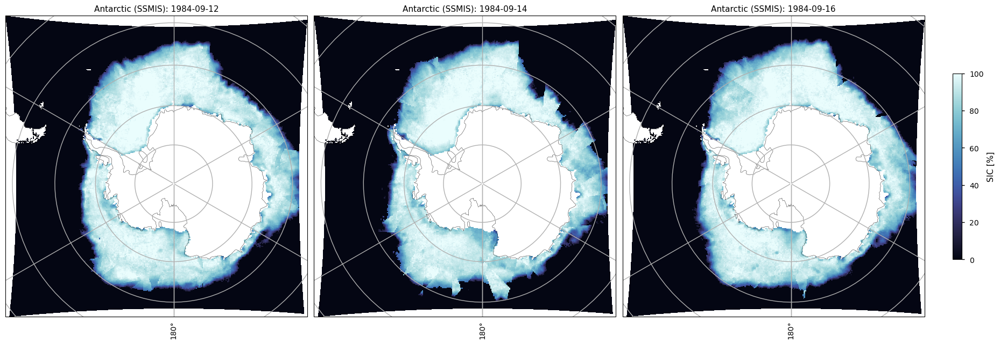

In [31]:
for hemisphere in ("north", "south"):
    compare_maps_anomaly(datasets_19840914, hemisphere=hemisphere)

The day-to-day differences are plotted below, and show the changes mentioned above more clearly. In the Arctic, there is a clear effect in the polar hole, while in the Antarctic there are jumps closer to the ice edge, possibly in between satellite swaths.

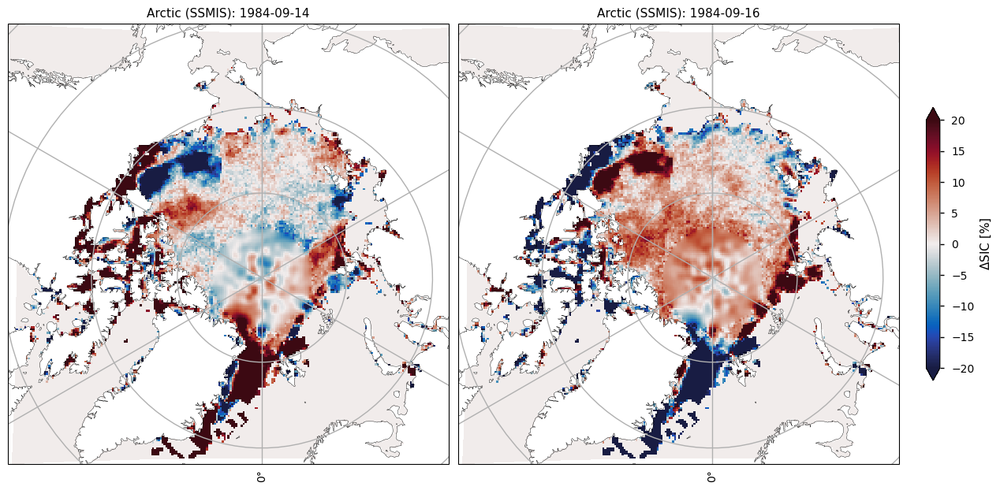

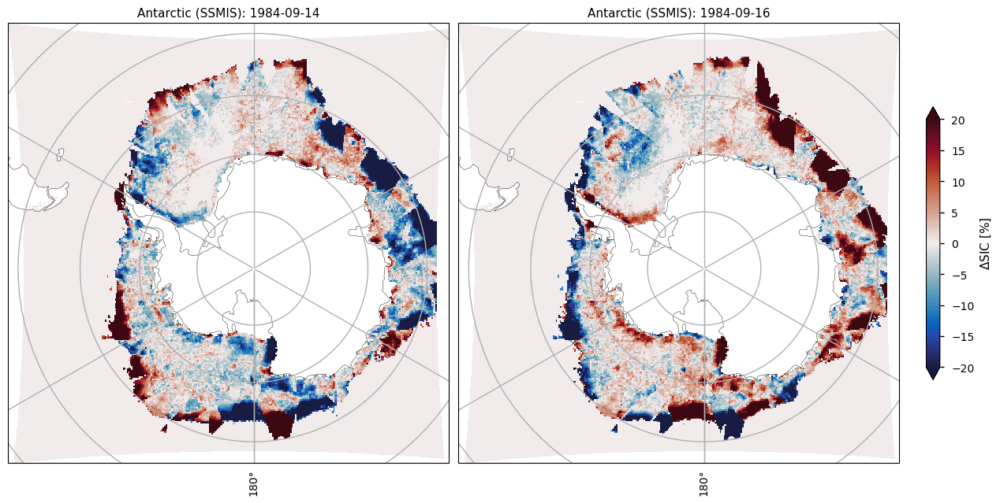

In [32]:
for hemisphere in ("north", "south"):
    diff_maps_anomaly(datasets_19840914, hemisphere=hemisphere)

(section-4.3)=
#### 4.3 Anomaly on 1984-11-19
Below we can see maps for both hemispheres for the days surrounding the anomaly. In the Arctic there is a sudden increase in the SIC around the north pole and in the Greenland Sea, although the jump in the Greenland Sea is less dramatic than in the previous anomaly. In the Antarctic there is a sudden jump nearly around the entire continent.

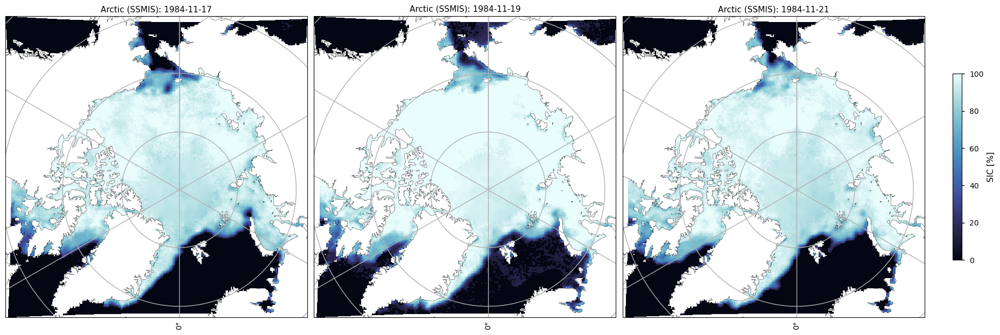

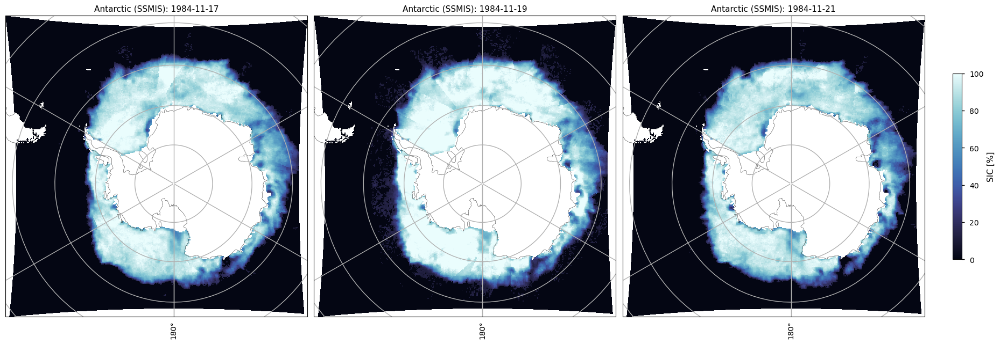

In [33]:
for hemisphere in ("north", "south"):
    compare_maps_anomaly(datasets_19841119, hemisphere=hemisphere)

When we look at the day-to-day differences, we can see that the Arctic has an increase nearly everywhere on 1984-11-19, and the polar hole is also having an effect. The changes are mostly reversed going to the next day.
For the Antarctic, the SIC increases nearly everywhere, and the individual satellite swaths are also having an effect.

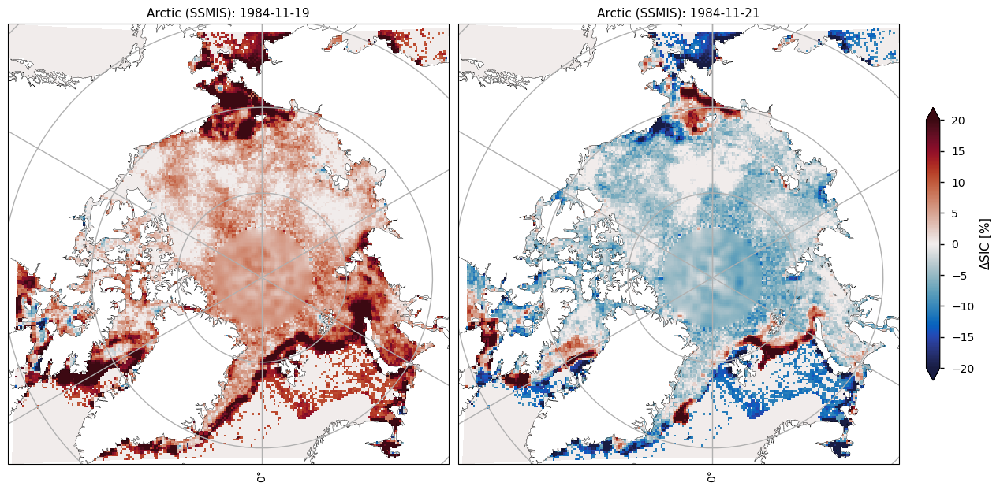

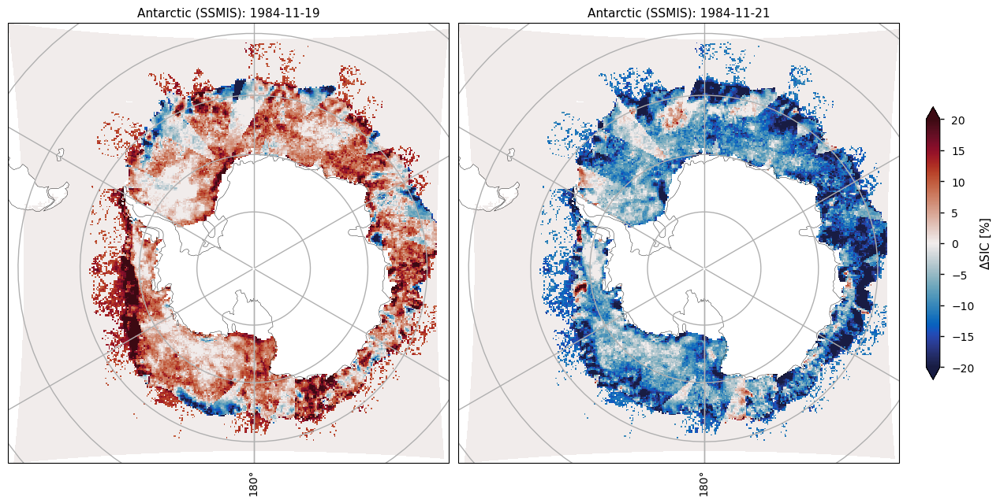

In [34]:
for hemisphere in ("north", "south"):
    diff_maps_anomaly(datasets_19841119, hemisphere=hemisphere)

(section-4.4)=
#### 4.4 Anomaly from 1989-07-21 to 1989-07-22
Below we can see maps for Antarctica for the days surrounding the anomaly in extent. There is a large section of missing data on both the days with suspiciously low extents.

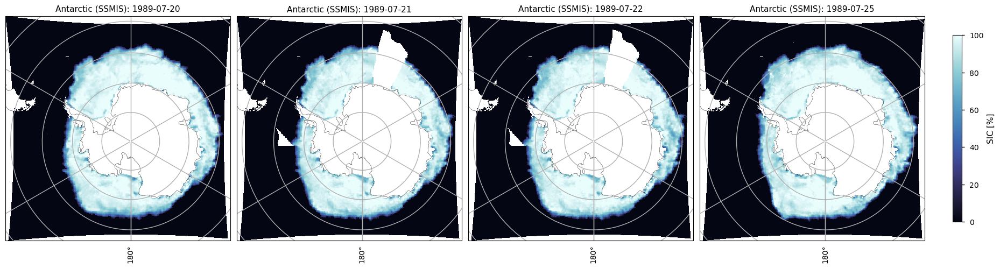

In [35]:
compare_maps_anomaly(datasets_20220721_20220722, hemisphere="south")

(section-4.5)=
#### 4.5 Anomaly on 2022-08-22
Below we can see maps for both hemispheres for the days surrounding the anomaly in extent. In this event, the SIC drops nearly everywhere on 2022-08-22, before recovering to about the previous level on the day after.

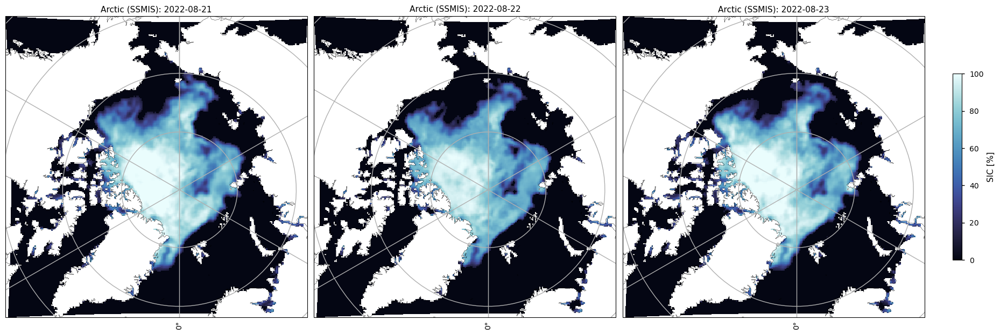

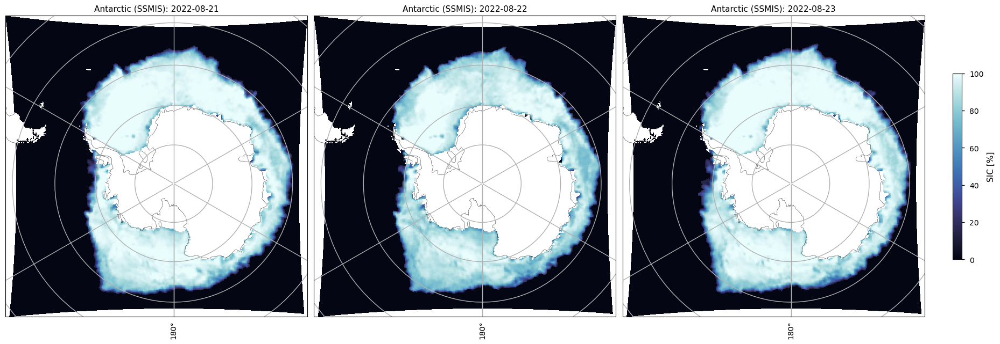

In [36]:
for hemisphere in ("north", "south"):
    compare_maps_anomaly(datasets_20220822, hemisphere=hemisphere)

## ℹ️ If you want to know more

### Key resources

Introductory sea ice materials:
- [<span style="color:blue">Role of sea ice in the climate</span>](https://marine.copernicus.eu/explainers/why-ocean-important/sea-ice)
- [<span style="color:blue">Sea ice as an indicator of climate change</span>](https://climate.copernicus.eu/climate-indicators/sea-ice#)
- [<span style="color:blue">Observing sea ice with satellites</span>](https://www.metoffice.gov.uk/research/climate/cryosphere-oceans/sea-ice/measure)

Code libraries used:
* [<span style="color:blue">C3S EQC custom functions</span>](https://github.com/bopen/c3s-eqc-automatic-quality-control/tree/main/c3s_eqc_automatic_quality_control), `c3s_eqc_automatic_quality_control`,  prepared by [B-Open](https://www.bopen.eu/).

### References

1. Ivanova, N., Pedersen, L. T., Tonboe, R. T., Kern, S., Heygster, G., Lavergne, T., Sørensen, A., Saldo, R., Dybkjær, G., Brucker, L., & Shokr, M. (2015). Inter-comparison and evaluation of sea ice algorithms: towards further identification of challenges and optimal approach using passive microwave observations. The Cryosphere, 9(5), 1797-1817, [<span style="color:blue"> https://doi.org/10.5194/tc-9-1797-2015 </span>](https://doi.org/10.5194/tc-9-1797-2015).

2. Comiso, J. C., Cavalieri, D. J., Parkinson, C. L., & Gloersen, P. (1997). Passive microwave algorithms for sea ice concentration: A comparison of two techniques. Remote sensing of Environment, 60(3), 357-384, [<span style="color:blue"> https://doi.org/10.1016/S0034-4257%2896%2900220-9 </span>](https://doi.org/10.1016/S0034-4257%2896%2900220-9).

3. Buckley, E. M., Horvat, C., & Yoosiri, P. (2024). Sea Ice Concentration Estimates from ICESat-2 Linear Ice Fraction. Part 1: Multi-sensor Comparison of Sea Ice Concentration Products. EGUsphere, 2024, 1-19, [<span style="color:blue"> https://doi.org/10.5194/egusphere-2024-3861 </span>](https://doi.org/10.5194/egusphere-2024-3861).